In [1]:
%load_ext autoreload
%autoreload 2
!hostname
!pwd
import os, sys
print(sys.executable)
# os.environ['CUDA_VISIBLE_DEVICES'] = "4"
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
sys.path.append(os.path.abspath(".."))

slurm0-gpu1nodeset-0
/home/akarsh_sakana_ai/nca-alife/src/notebooks
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/bin/python


In [2]:
import os, sys, glob, pickle
from functools import partial

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

from tqdm.auto import tqdm
from einops import rearrange, reduce, repeat

In [3]:
import experiment_utils
import util

# Create Experiment

In [140]:
cfg_default = dict(
    n_iters=200, 
)

n_rollout_imgs_sweep = [128]
seed_sweep = np.arange(8)
sigma_sweep = [0.01, 0.03, 0.1, 0.3, 1.0]

cfgs = []

for sigma in sigma_sweep:
    for n_rollout_imgs in n_rollout_imgs_sweep:
        for seed in seed_sweep:
            cfg = cfg_default.copy()
            cfg.update(seed=seed, sigma=sigma, n_rollout_imgs=n_rollout_imgs)
            cfg.update(save_dir=f"/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/{n_rollout_imgs}_{seed}_{sigma}/")
            cfgs.append(cfg)

print(len(cfgs))

40


In [141]:
commands = experiment_utils.create_commands(cfgs, prefix='python main_plife_plus_oe.py', out_file='../science_scripts/main_plife_plus.sh')
print('\n'.join(commands[:3]), '\n...')
print(len(commands), 'commands')

python main_plife_plus_oe.py --n_iters=200 --seed=0 --sigma=0.01 --n_rollout_imgs=128 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/128_0_0.01/"
python main_plife_plus_oe.py --n_iters=200 --seed=1 --sigma=0.01 --n_rollout_imgs=128 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/128_1_0.01/"
python main_plife_plus_oe.py --n_iters=200 --seed=2 --sigma=0.01 --n_rollout_imgs=128 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/128_2_0.01/" 
...
40 commands


# Visualize Results

In [48]:
import jax
import jax.numpy as jnp
import copy
import imageio

In [49]:
from create_sim import create_sim, FlattenSimulationParameters, rollout_and_embed_simulation, rollout_simulation

In [50]:
from models.models_plife_plus import ParticleLifePlus
from create_sim import rollout_simulation

In [11]:
sim = ParticleLifePlus(n_particles=1000, dt=0.02, render_radius=0.04, sharpness=30., background_color='black')
sim = FlattenSimulationParameters(sim)
rollout_fn = partial(rollout_simulation, sim=sim, rollout_steps=1024, n_rollout_imgs='video', img_size=256)
rollout_fn = jax.jit(rollout_fn)


2024-12-07 19:08:11.957035: W external/xla/xla/service/gpu/nvptx_compiler.cc:836] The NVIDIA driver's CUDA version is 12.2 which is older than the PTX compiler version (12.6.68). Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


ParameterReshaper: 311 parameters detected for optimization.


In [12]:
rng = jax.random.PRNGKey(0)
params = sim.default_params(rng)

# params = df['best_params'][14]
save_dir = '/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/157_0.1/'
params, loss = util.load_pkl(save_dir, 'best')
print(loss)

rollout_data = rollout_fn(rng, params)

0.82777965


In [71]:
vid = rollout_data['rgb']
vid = np.array(vid*255, dtype=np.uint8)
import imageio
imageio.mimwrite("/home/akarsh_sakana_ai/nca-alife-data/plife_plus/temp1.mp4", vid, fps=30)

/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


In [14]:
sim = ParticleLifePlus(n_particles=1000, dt=0.02, render_radius=0.04, sharpness=30., update_colors=False, background_color='black')
sim = FlattenSimulationParameters(sim)
rollout_fn = partial(rollout_simulation, sim=sim, rollout_steps=1024, n_rollout_imgs='video', img_size=256)
rollout_fn = jax.jit(rollout_fn)

rollout_data = []
for i in tqdm(range(25)):
    rng = jax.random.PRNGKey(i)
    params = sim.default_params(rng)
    rdi = rollout_fn(rng, params)
    rdi = jax.tree.map(lambda x: np.array(x), rdi)
    rollout_data.append(rdi)
rollout_data = jax.tree.map(lambda *x: np.stack(x), *rollout_data)


vid = rollout_data['rgb']
print(vid.shape)
vid = rearrange(vid, "(R C) T H W D -> T (R H) (C W) D", R=5)
vid = np.array(vid*255, dtype=np.uint8)
imageio.mimwrite("/home/akarsh_sakana_ai/nca-alife-data/plife_plus/random_params_no_color_update.mp4", vid, fps=30)

sim = ParticleLifePlus(n_particles=1000, dt=0.02, render_radius=0.04, sharpness=30., update_colors=True, background_color='black')
sim = FlattenSimulationParameters(sim)
rollout_fn = partial(rollout_simulation, sim=sim, rollout_steps=1024, n_rollout_imgs='video', img_size=256)
rollout_fn = jax.jit(rollout_fn)

rollout_data = []
for i in tqdm(range(25)):
    rng = jax.random.PRNGKey(i)
    params = sim.default_params(rng)
    rdi = rollout_fn(rng, params)
    rdi = jax.tree.map(lambda x: np.array(x), rdi)
    rollout_data.append(rdi)
rollout_data = jax.tree.map(lambda *x: np.stack(x), *rollout_data)


vid = rollout_data['rgb']
print(vid.shape)
vid = rearrange(vid, "(R C) T H W D -> T (R H) (C W) D", R=5)
vid = np.array(vid*255, dtype=np.uint8)
imageio.mimwrite("/home/akarsh_sakana_ai/nca-alife-data/plife_plus/random_params_color_update.mp4", vid, fps=30)

ParameterReshaper: 311 parameters detected for optimization.


  0%|          | 0/25 [00:00<?, ?it/s]

(25, 1024, 256, 256, 3)


/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


In [11]:
from clip_jax import MyFlaxCLIP
clip_model = MyFlaxCLIP()

2024-11-20 20:17:18.289548: W external/xla/xla/service/gpu/nvptx_compiler.cc:836] The NVIDIA driver's CUDA version is 12.2 which is older than the PTX compiler version (12.6.68). Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [12]:
sim = ParticleLifePlus(n_particles=1000, dt=0.02, render_radius=0.04, sharpness=30., update_colors=True, background_color='black')
sim = FlattenSimulationParameters(sim)
rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=clip_model, rollout_steps=1024, n_rollout_imgs='video')
rollout_fn = jax.jit(rollout_fn)

rollout_data = []
for i in tqdm(range(25)):
    rng = jax.random.PRNGKey(i)
    params = sim.default_params(rng)
    rdi = rollout_fn(rng, params)
    rdi = jax.tree.map(lambda x: np.array(x), rdi)
    rollout_data.append(rdi)
rollout_data = jax.tree.map(lambda *x: np.stack(x), *rollout_data)


# vid = rollout_data['rgb']
# print(vid.shape)
# vid = rearrange(vid, "(R C) T H W D -> T (R H) (C W) D", R=5)
# vid = np.array(vid*255, dtype=np.uint8)
# imageio.mimwrite("/home/akarsh_sakana_ai/nca-alife-data/plife_plus/random_params_color_update.mp4", vid, fps=30)

ParameterReshaper: 311 parameters detected for optimization.


  0%|          | 0/25 [00:00<?, ?it/s]

Could not load symbol cuFuncGetName. Error: /lib/x86_64-linux-gnu/libcuda.so.1: undefined symbol: cuFuncGetName
2024-11-20 20:18:42.488521: E external/xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[1024,768,7,7]{3,2,1,0}, u8[0]{0}) custom-call(f32[1024,3,224,224]{3,2,1,0}, f32[768,3,32,32]{3,2,1,0}), window={size=32x32 stride=32x32}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false} is taking a while...
2024-11-20 20:18:42.939234: E external/xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.450845016s
Trying algorithm eng0{} for conv (f32[1024,768,7,7]{3,2,1,0}, u8[0]{0}) custom-call(f32[1024,3,224,224]{3,2,1,0}, f32[768,3,32,32]{3,2,1,0}), window={size=32x32 stride=32x32}, dim_labels=bf01_oi01->b

In [14]:
z = rollout_data['z']
z.shape

(25, 1024, 512)

In [20]:
def get_oe_score(z):
    scores_novelty = (z @ z.T) # T T
    scores_novelty = jnp.tril(scores_novelty, k=-1)
    oe = scores_novelty.max(axis=-1) # T
    return oe.mean()

oe_score = jax.vmap(get_oe_score)(z)
oe_score

Array([0.9984057 , 0.998145  , 0.9988202 , 0.99733627, 0.99875987,
       0.996083  , 0.9981255 , 0.9961146 , 0.9983953 , 0.9987016 ,
       0.9987443 , 0.99784905, 0.9987558 , 0.99865675, 0.99869174,
       0.99767447, 0.99873745, 0.9980138 , 0.9987692 , 0.99863636,
       0.9971739 , 0.99888223, 0.99890774, 0.99658287, 0.9987349 ],      dtype=float32)

In [22]:
oe_score[oe_score.argsort()]

Array([0.996083  , 0.9961146 , 0.99658287, 0.9971739 , 0.99733627,
       0.99767447, 0.99784905, 0.9980138 , 0.9981255 , 0.998145  ,
       0.9983953 , 0.9984057 , 0.99863636, 0.99865675, 0.99869174,
       0.9987016 , 0.9987349 , 0.99873745, 0.9987443 , 0.9987558 ,
       0.99875987, 0.9987692 , 0.9988202 , 0.99888223, 0.99890774],      dtype=float32)

In [23]:
oe_score.argsort()

Array([ 5,  7, 23, 20,  3, 15, 11, 17,  6,  1,  8,  0, 19, 13, 14,  9, 24,
       16, 10, 12,  4, 18,  2, 21, 22], dtype=int32)

In [156]:
df = []
for cfg in cfgs:
    dfi = cfg.copy()
    try:
        params, fitness = util.load_pkl(dfi['save_dir'], 'best')
        dfi['best_loss'] = fitness.item()
        dfi['best_params'] = params
        data = util.load_pkl(dfi['save_dir'], 'data')
        dfi['data'] = data
    except Exception as e:
        print(e)
        print(f"No data found for {dfi['save_dir']}")
        break
    df.append(dfi)
df = pd.DataFrame(df)

Text(0, 0.5, 'Loss')

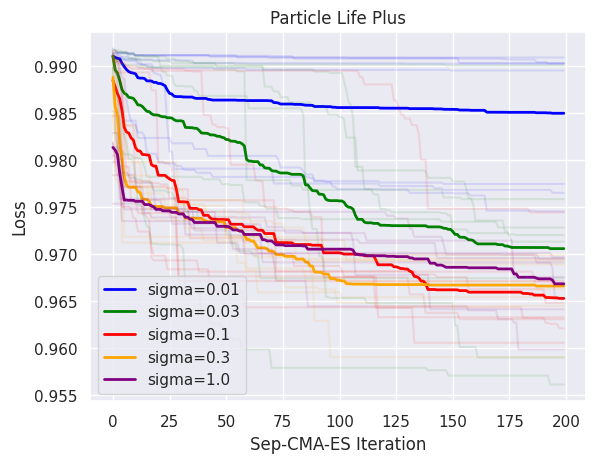

In [158]:
for sigma, c in zip(sigma_sweep, ['blue', 'green', 'red', 'orange', 'purple']):
    a = np.array([dfi['data']['best_loss'] for i, dfi in df[df.sigma==sigma].iterrows()])
    plt.plot(a.T, c=c, alpha=0.1)
    plt.plot(a.mean(axis=0), c=c, lw=2, label=f"sigma={sigma}")
plt.legend()

plt.title("Particle Life Plus")
plt.xlabel("Sep-CMA-ES Iteration")
plt.ylabel("Loss")

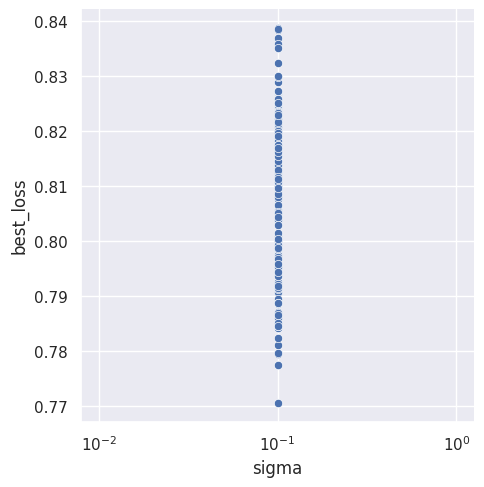

In [13]:
sns.relplot(data=df, x='sigma', y='best_loss')
plt.xscale('log')

In [14]:
a = [dfi['data']['best_loss'] for _, dfi in df.iterrows()]
a = np.array([ai for ai in a])

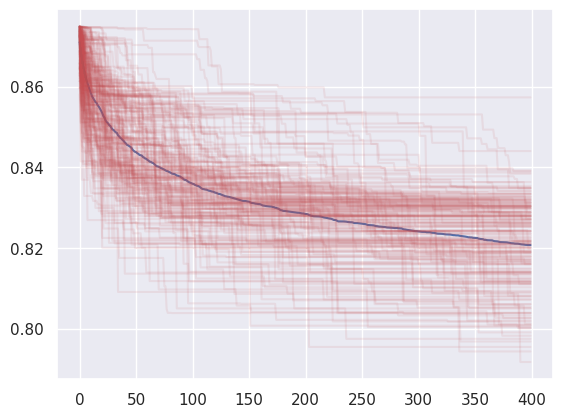

In [15]:
plt.plot(a.mean(axis=0))
plt.plot(a.T, alpha=0.1, c='r')

In [20]:
sim = ParticleLifePlus(n_particles=1000, dt=0.02, render_radius=0.04, sharpness=30., background_color='black')
sim = FlattenSimulationParameters(sim)
rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=None, rollout_steps=2048*8, n_rollout_imgs=8, chunk_ends=True)
rollout_fn = jax.jit(rollout_fn)
rng = jax.random.PRNGKey(0)

ParameterReshaper: 311 parameters detected for optimization.


loss:  0.7917432188987732
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/114_0.1/


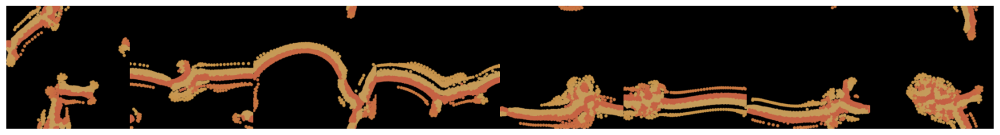

loss:  0.7943592071533203
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/12_0.1/


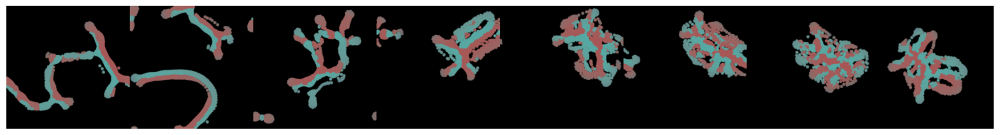

loss:  0.7954797744750977
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/34_0.1/


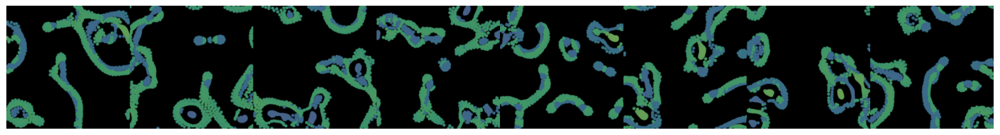

loss:  0.7968227863311768
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/196_0.1/


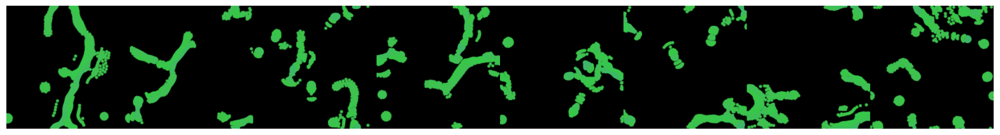

loss:  0.7974793910980225
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/23_0.1/


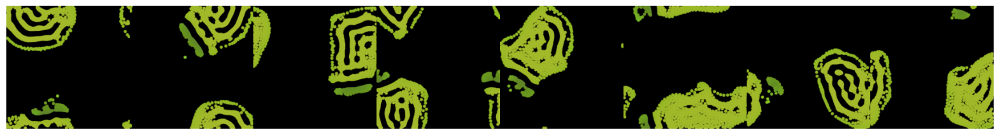

loss:  0.7982537746429443
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/50_0.1/


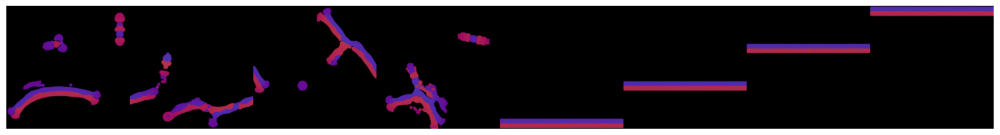

loss:  0.7990814447402954
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/170_0.1/


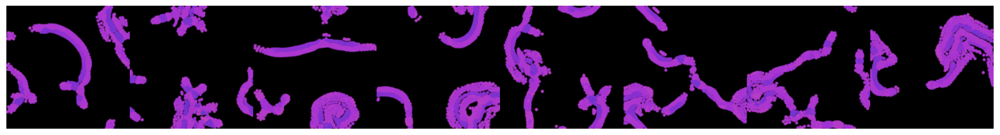

loss:  0.8001058101654053
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/28_0.1/


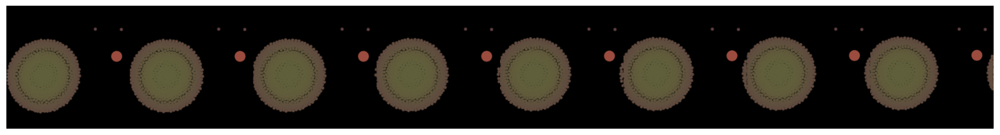

loss:  0.8001386523246765
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/145_0.1/


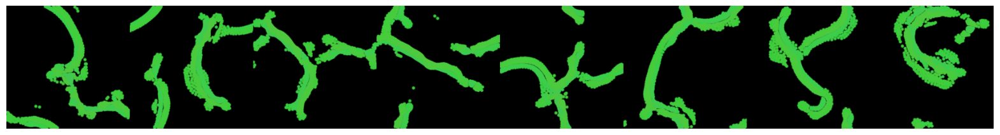

loss:  0.8004093170166016
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/180_0.1/


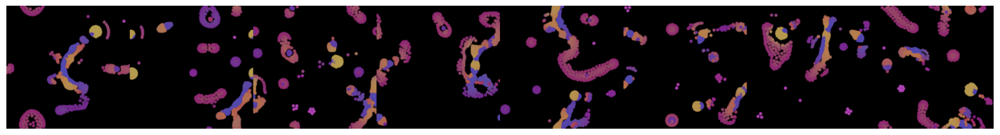

loss:  0.8007413148880005
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/136_0.1/


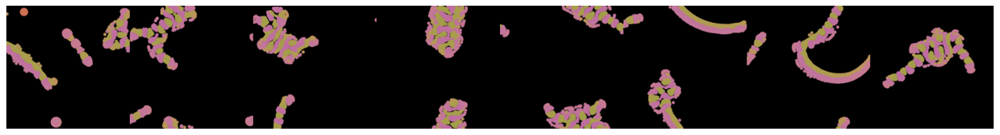

loss:  0.8008323311805725
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/143_0.1/


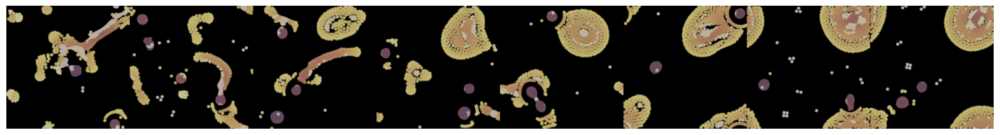

loss:  0.8010764122009277
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/151_0.1/


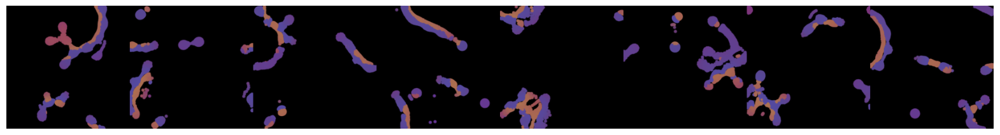

loss:  0.8012303113937378
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/138_0.1/


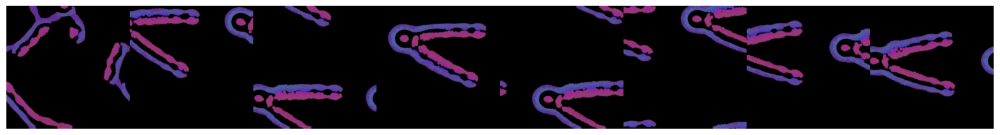

loss:  0.8017680048942566
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/6_0.1/


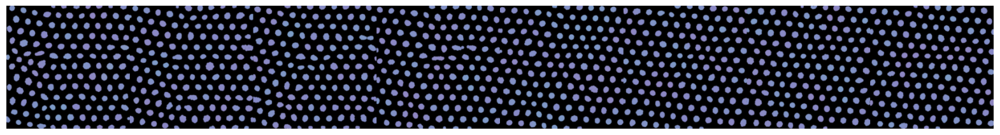

loss:  0.8020426034927368
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/165_0.1/


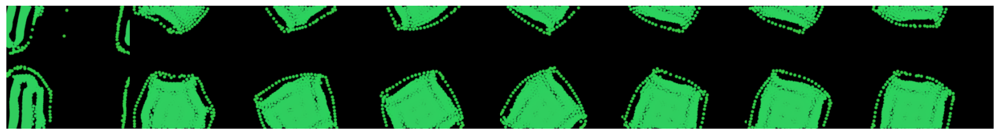

loss:  0.8026249408721924
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/158_0.1/


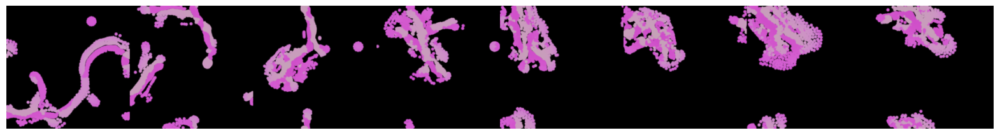

loss:  0.8026885986328125
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/46_0.1/


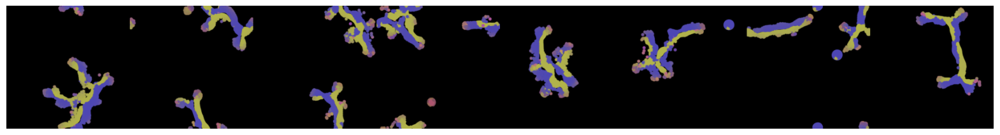

loss:  0.8032822608947754
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/140_0.1/


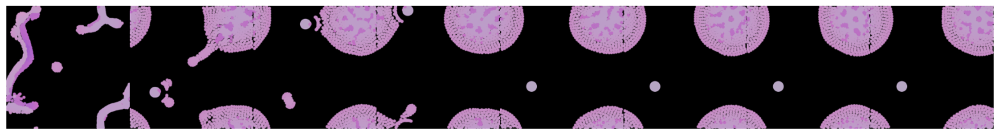

loss:  0.8038597702980042
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/42_0.1/


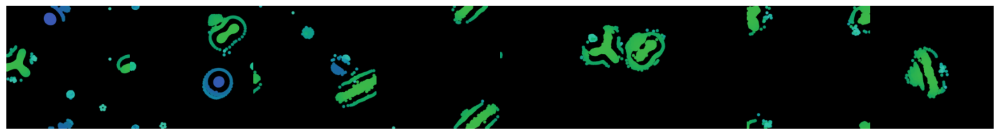

loss:  0.803866982460022
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/95_0.1/


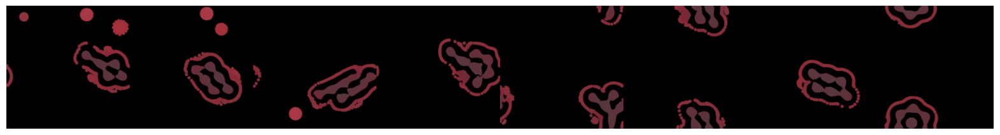

loss:  0.8039666414260864
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/191_0.1/


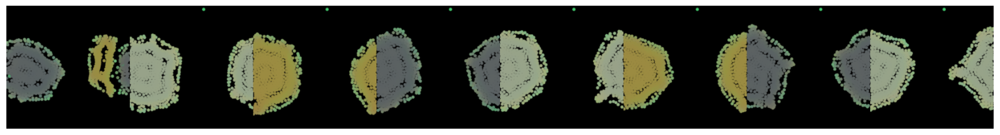

loss:  0.8050183057785034
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/41_0.1/


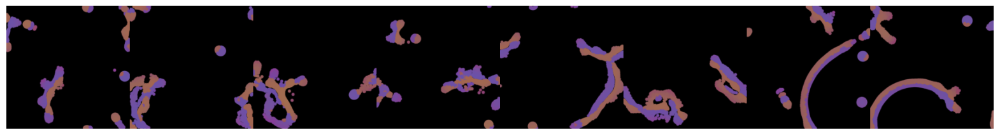

loss:  0.8051040172576904
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/167_0.1/


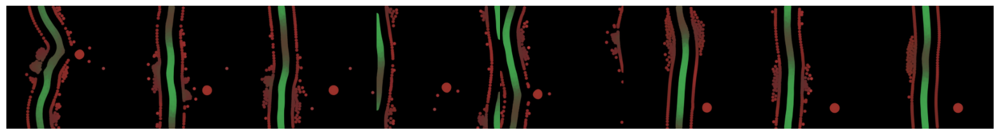

loss:  0.8054279088973999
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/107_0.1/


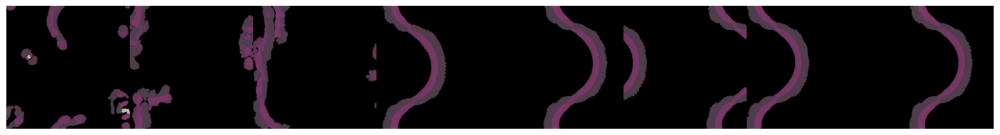

loss:  0.8060282468795776
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/139_0.1/


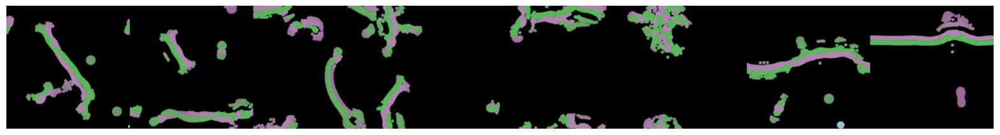

loss:  0.8060882687568665
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/185_0.1/


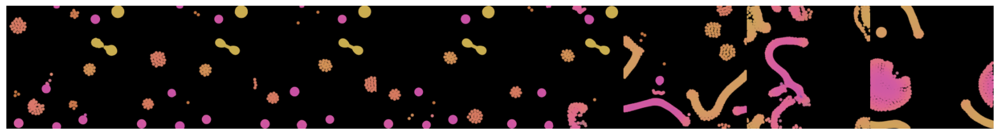

loss:  0.807171106338501
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/120_0.1/


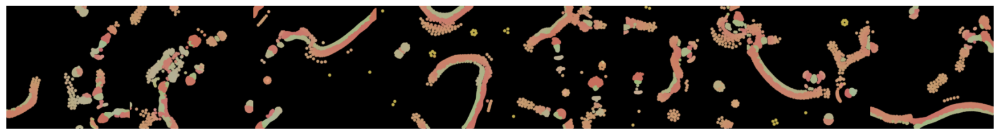

loss:  0.8072892427444458
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/61_0.1/


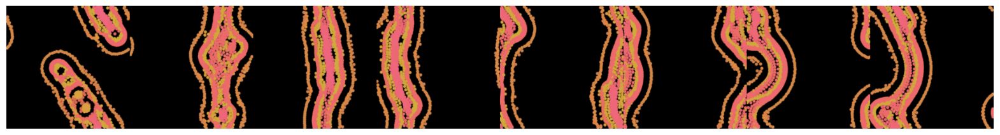

loss:  0.8078998327255249
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/13_0.1/


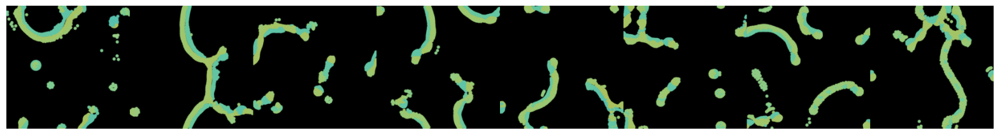

loss:  0.808120608329773
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/161_0.1/


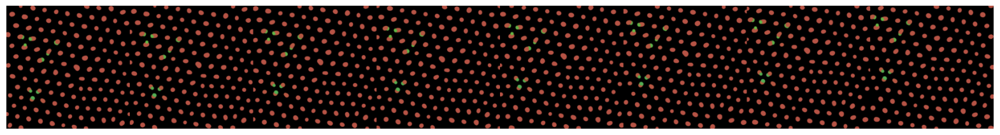

loss:  0.8081930875778198
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/30_0.1/


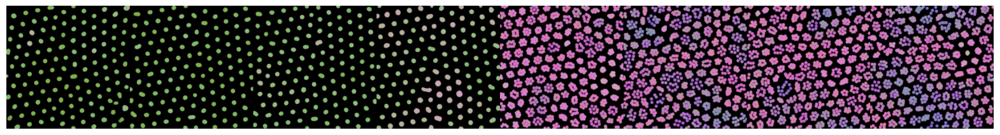

loss:  0.8088365197181702
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/70_0.1/


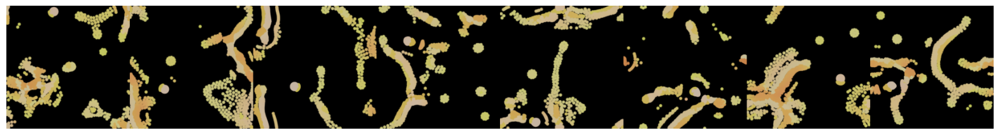

loss:  0.8091037273406982
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/102_0.1/


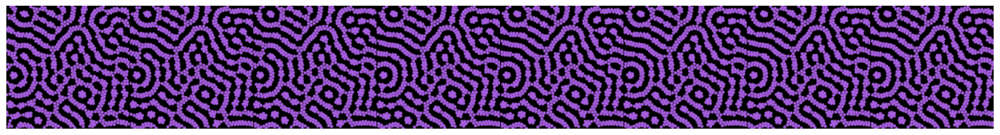

loss:  0.8093795776367188
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/93_0.1/


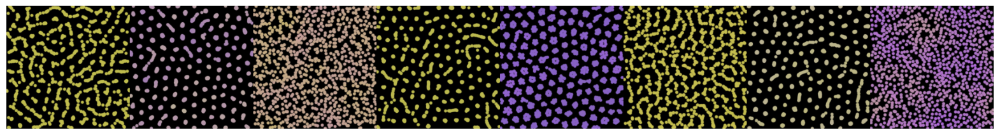

loss:  0.8102608323097229
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/105_0.1/


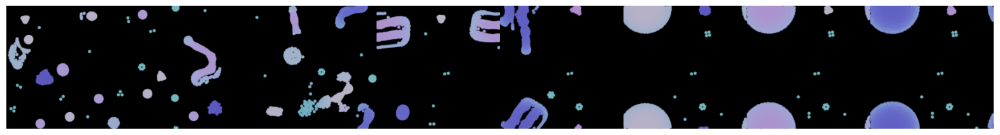

loss:  0.8110132217407227
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/113_0.1/


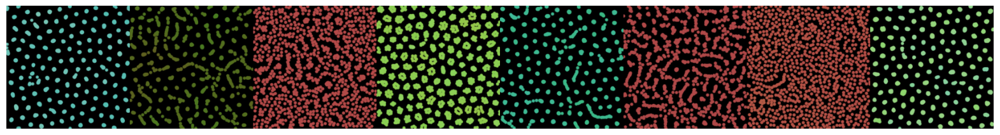

loss:  0.8110283613204956
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/63_0.1/


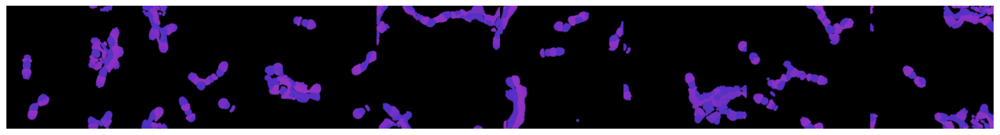

loss:  0.8111228942871094
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/20_0.1/


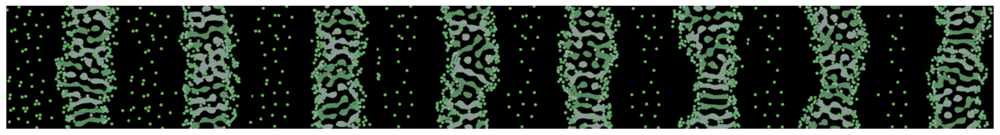

loss:  0.8113152384757996
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/3_0.1/


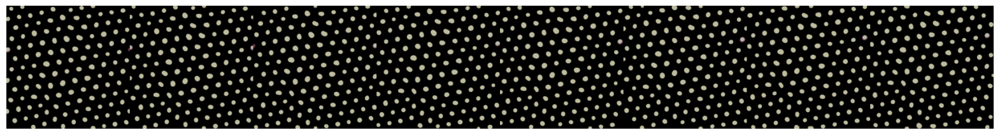

loss:  0.811487078666687
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/163_0.1/


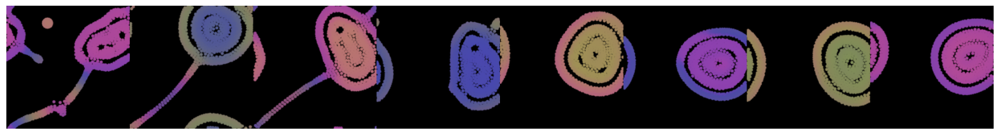

loss:  0.8115369081497192
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/126_0.1/


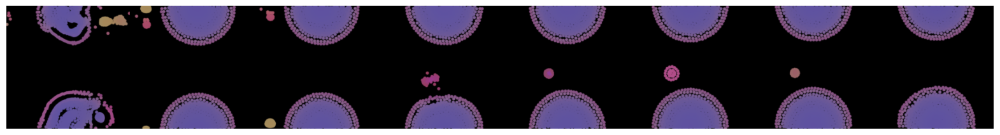

loss:  0.8117027282714844
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/56_0.1/


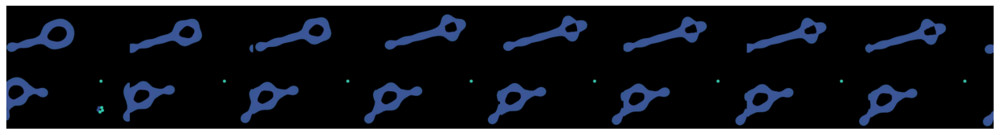

loss:  0.8117947578430176
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/59_0.1/


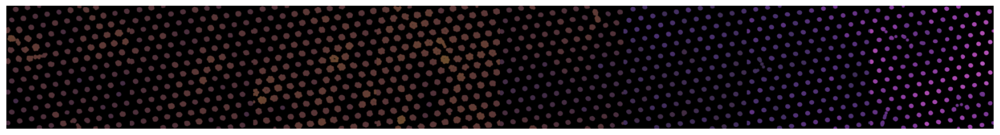

loss:  0.8118187785148621
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/174_0.1/


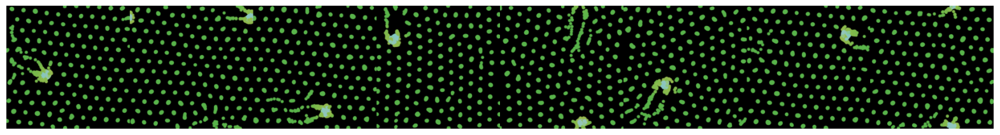

loss:  0.8122749328613281
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/8_0.1/


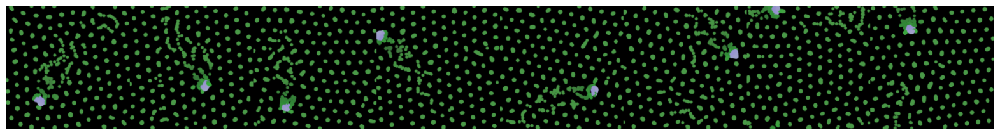

loss:  0.8123469948768616
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/142_0.1/


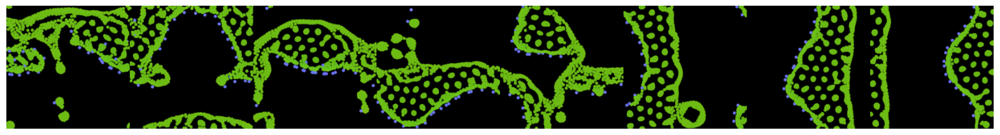

loss:  0.8126918077468872
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/188_0.1/


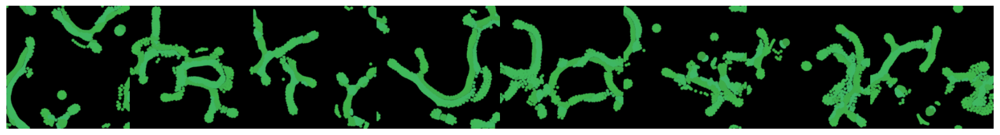

loss:  0.8132893443107605
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/164_0.1/


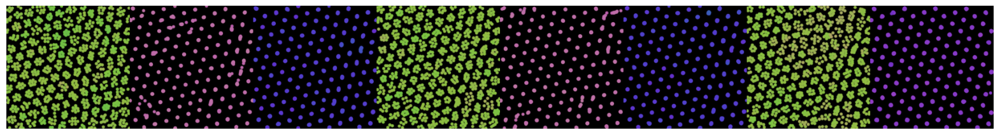

loss:  0.8136177062988281
/home/akarsh_sakana_ai/nca-alife-data/plife_plus_oe/27_0.1/


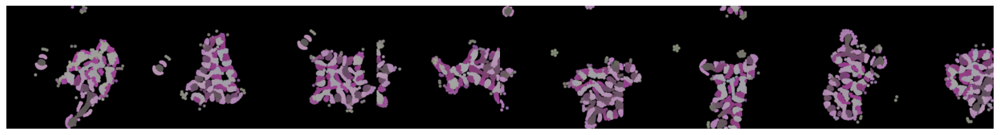

In [21]:
for _, dfi in df.iloc[df['best_loss'].argsort()[:50]].iterrows():
    print('loss: ', dfi['best_loss'])
    print(dfi['save_dir'])
    params = dfi['best_params']

    rollout_data = rollout_fn(rng, params)
    img = rollout_data['rgb']
    img = rearrange(img, "T H W D -> H (T W) D")
    plt.figure(figsize=(20, 4))
    plt.imshow(img)
    plt.grid(False)
    plt.axis('off')
    plt.show()

In [ ]:
rng = jax.random.PRNGKey(0)

params = sim.default_params(rng)